In [1]:
import Pkg

project_directory = normpath(
    joinpath(@__DIR__, "..", "..")
)

Pkg.activate(project_directory)
Pkg.instantiate()

println("Active project: ", Base.active_project())

using LongitudinalTomography
using CairoMakie
using Random
using Printf

println(
    "LongitudinalTomography loaded from: ",
    pathof(LongitudinalTomography),
)

  Activating project at `~/Desktop/longitudinal_dynamics`


Active project: /Users/gonza839/Desktop/longitudinal_dynamics/Project.toml
LongitudinalTomography loaded from: /Users/gonza839/Desktop/longitudinal_dynamics/src/LongitudinalTomography.jl


In [2]:
const PROTON_MASS_EV = 938.2720813e6
const TOTAL_ENERGY_EV = 8.0e9 + PROTON_MASS_EV
const GAMMA_S = TOTAL_ENERGY_EV / PROTON_MASS_EV
const BETA_S = sqrt(1 - 1 / GAMMA_S^2)

rf1 = SingleRFMachine(
    harmonic=588,
    f_rev_hz=89.8e3,
    eta0=-8.8e-3,
    beta_s=BETA_S,
    E_s_eV=TOTAL_ENERGY_EV,
    rf_kick_eV=60e3,
)

two_rf = NonInteractingTwoRFMachine(
    rf1;
    f_slip_hz=84 * 15.0,
    relative_phase0=0.0,
)

@printf("nu_s1                 = %.6f\n", synchrotron_tune(two_rf.rf1))
@printf("nu_slip               = %.6f\n", slip_tune(two_rf))
@printf("alpha_s               = %.3f\n", slip_stacking_parameter(two_rf))
@printf("slip period           = %.3f turns\n", 1 / abs(slip_tune(two_rf)))
@printf("fractional separation = %.6e\n", fractional_momentum_separation(two_rf))
@printf("energy separation     = %.3f MeV\n", energy_separation_eV(two_rf) * 1e-6)

nu_s1                 = 0.002364
nu_slip               = 0.014031
alpha_s               = 5.935
slip period           = 71.270 turns
fractional separation = -2.711654e-03
energy separation     = -23.970 MeV


In [3]:
rng = MersenneTwister(1234)
n_particles = 300

u1 = 0.22 .* randn(rng, n_particles)
v1 = 0.28 .* randn(rng, n_particles)
theta1_0, P1_0 = trapped_coordinates(u1, v1; momentum_fraction=0.90)

u2 = 0.22 .* randn(rng, n_particles)
v2 = 0.28 .* randn(rng, n_particles)
theta2_0, P2_0 = trapped_coordinates(u2, v2; momentum_fraction=0.90)

turns = collect(0.0:1.0:250.0)

trajectory = noninteracting_two_rf_transport(
    theta1_0,
    P1_0,
    theta2_0,
    P2_0,
    turns,
    two_rf,
)

(turns = [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0  …  241.0, 242.0, 243.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0], N0 = 0.0, nu_slip = 0.014031180400890868, alpha_s = 5.934706305093539, slip_phase = [0.0, 0.08816050653726368, 0.17632101307452736, 0.264481519611791, 0.3526420261490547, 0.4408025326863184, 0.528963039223582, 0.6171235457608457, 0.7052840522981094, 0.7934445588353731  …  21.246682075480546, 21.33484258201781, 21.423003088555074, 21.511163595092338, 21.599324101629602, 21.687484608166866, 21.77564511470413, 21.863805621241394, 21.951966127778654, 22.040126634315918], family1 = (theta = [-0.5552862952475276 1.6044492448063032 … 0.8709985751909861 -0.38206587679595033; -0.5460007738961746 1.604462439237901 … 0.8660077226025052 -0.37612930598805117; … ; 0.2648568177545877 -1.6033974551814059 … -0.6961029021636009 0.14809134246476377; 0.25316335278859015 -1.603979415941807 … -0.6871732074882626 0.14021720378324085], P = [0.6211778229447806 0.0083115366007750

In [4]:
rf2_bucket_offset = +1  # +1: right, -1: left

1

In [5]:
theta2_rf1_absolute =
    trajectory.family2.theta_rf1_unwrapped .+
    2π * rf2_bucket_offset

delta_t2_rf1_absolute =
    delta_t_from_theta(
        theta2_rf1_absolute,
        two_rf.rf1,
    )

delta_E2_rf1_absolute =trajectory.family2.delta_E_rf1

251×300 Matrix{Float64}:
 -2.41095e7  -2.16936e7  -2.39263e7  …  -2.48742e7  -2.3746e7   -2.24484e7
 -2.40746e7  -2.17362e7  -2.38725e7     -2.49063e7  -2.37352e7  -2.24317e7
 -2.40397e7  -2.17792e7  -2.38188e7     -2.49381e7  -2.37244e7  -2.24152e7
 -2.40048e7  -2.18225e7  -2.3765e7      -2.49698e7  -2.37137e7  -2.23992e7
 -2.39699e7  -2.18661e7  -2.37113e7     -2.50013e7  -2.37031e7  -2.23834e7
 -2.3935e7   -2.191e7    -2.36576e7  …  -2.50326e7  -2.36924e7  -2.2368e7
 -2.39001e7  -2.19543e7  -2.3604e7      -2.50637e7  -2.36819e7  -2.23529e7
 -2.38652e7  -2.19988e7  -2.35504e7     -2.50945e7  -2.36714e7  -2.23382e7
 -2.38304e7  -2.20436e7  -2.34968e7     -2.51252e7  -2.3661e7   -2.23238e7
 -2.37955e7  -2.20888e7  -2.34433e7     -2.51557e7  -2.36506e7  -2.23097e7
  ⋮                                  ⋱                          
 -2.47045e7  -2.54931e7  -2.4709e7      -2.23202e7  -2.44886e7  -2.58229e7
 -2.47379e7  -2.54459e7  -2.47622e7     -2.22946e7  -2.44969e7  -2.58295e7
 -2.47712e7

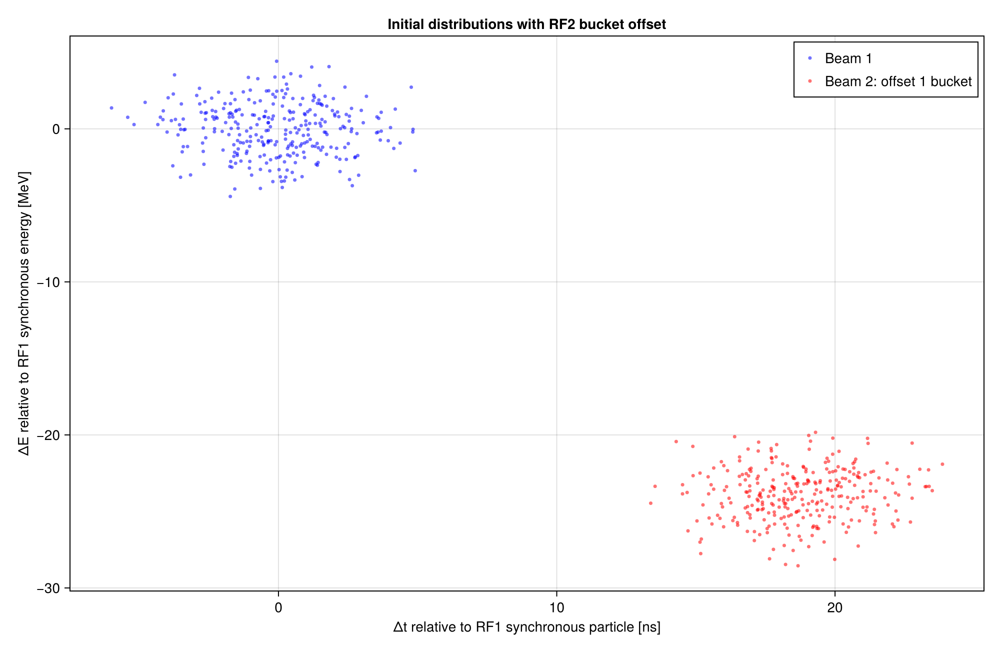

CairoMakie.Screen{IMAGE}


In [6]:
rf2_bucket_offset = +1  # change to -1 for one bucket to the left

theta2_rf1_absolute =
    trajectory.family2.theta_rf1_unwrapped .+
    2π * rf2_bucket_offset

delta_t2_rf1_absolute =
    delta_t_from_theta(
        theta2_rf1_absolute,
        two_rf.rf1,
    )

# Initial coordinates
delta_t1_initial_ns =
    trajectory.family1.delta_t[1, :] .* 1e9

delta_E1_initial_MeV =
    trajectory.family1.delta_E[1, :] .* 1e-6

delta_t2_initial_ns =
    delta_t2_rf1_absolute[1, :] .* 1e9

delta_E2_initial_MeV =
    trajectory.family2.delta_E_rf1[1, :] .* 1e-6


initial_figure = Figure(size=(1000, 650))

initial_axis = Axis(
    initial_figure[1, 1];
    xlabel="Δt relative to RF1 synchronous particle [ns]",
    ylabel="ΔE relative to RF1 synchronous energy [MeV]",
    title="Initial distributions with RF2 bucket offset",
    xgridvisible=true,
    ygridvisible=true,
)

scatter!(
    initial_axis,
    delta_t1_initial_ns,
    delta_E1_initial_MeV;
    color=(:blue, 0.55),
    markersize=5,
    label="Beam 1",
)

scatter!(
    initial_axis,
    delta_t2_initial_ns,
    delta_E2_initial_MeV;
    color=(:red, 0.55),
    markersize=5,
    label="Beam 2: offset $(rf2_bucket_offset) bucket",
)

axislegend(initial_axis; position=:rt)

display(initial_figure)

In [7]:
theta1_initial_rf1 = trajectory.family1.theta[1, :]
P1_initial_rf1 = trajectory.family1.P[1, :]

theta2_initial_rf1 = trajectory.family2.theta_rf1_wrapped[1, :]
P2_initial_rf1 = trajectory.family2.P_rf1[1, :]

300-element Vector{Float64}:
 5.969142156689949
 5.371008368537018
 5.923771028125972
 6.06258340694212
 6.465190055713742
 5.734644878708569
 6.16677332276423
 5.084274258691449
 6.260063651761392
 7.047943830022957
 ⋮
 5.697115940925728
 5.680552160309051
 5.386975806857198
 5.99541835271333
 5.652911141315976
 5.6798623921839395
 6.158476877678272
 5.879155210543603
 5.557883579240562

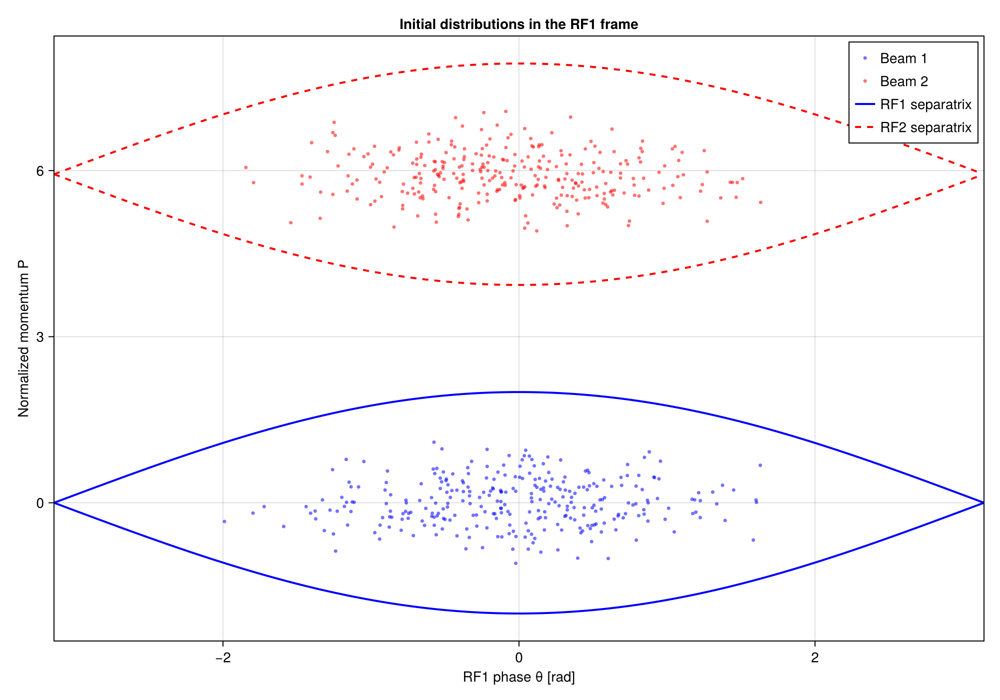

CairoMakie.Screen{IMAGE}


In [8]:
# Initial particle coordinates in the RF1 frame
theta1_initial_rf1 = trajectory.family1.theta[1, :]
P1_initial_rf1 = trajectory.family1.P[1, :]

theta2_initial_rf1 = trajectory.family2.theta_rf1_wrapped[1, :]
P2_initial_rf1 = trajectory.family2.P_rf1[1, :]


# RF1 separatrix
theta_separatrix = collect(range(-π, π; length=500))

P1_separatrix_upper = 2 .* cos.(theta_separatrix ./ 2)
P1_separatrix_lower = -P1_separatrix_upper


# RF2 separatrix expressed in RF1 coordinates
alpha_s_value = slip_stacking_parameter(two_rf)

momentum_scale = synchrotron_tune(two_rf.rf2) /
                 synchrotron_tune(two_rf.rf1)

theta2_separatrix_rf1 = wrap_to_pi(
    theta_separatrix .+ two_rf.relative_phase0
)

P2_separatrix_upper = alpha_s_value .+
                      momentum_scale .* P1_separatrix_upper

P2_separatrix_lower = alpha_s_value .+
                      momentum_scale .* P1_separatrix_lower

# Sort after wrapping so Makie draws continuous curves
separatrix_order = sortperm(theta2_separatrix_rf1)


# Plot
initial_figure = Figure(size=(1000, 700))

axis_initial = Axis(
    initial_figure[1, 1];
    xlabel="RF1 phase θ [rad]",
    ylabel="Normalized momentum P",
    title="Initial distributions in the RF1 frame",
    limits=((-π, π), nothing),
    xgridvisible=true,
    ygridvisible=true,
)

scatter!(
    axis_initial,
    theta1_initial_rf1,
    P1_initial_rf1;
    color=(:blue, 0.55),
    markersize=5,
    label="Beam 1",
)

scatter!(
    axis_initial,
    theta2_initial_rf1,
    P2_initial_rf1;
    color=(:red, 0.55),
    markersize=5,
    label="Beam 2",
)

# RF1 separatrix
lines!(
    axis_initial,
    theta_separatrix,
    P1_separatrix_upper;
    color=:blue,
    linewidth=2,
    label="RF1 separatrix",
)

lines!(
    axis_initial,
    theta_separatrix,
    P1_separatrix_lower;
    color=:blue,
    linewidth=2,
)

# RF2 separatrix at the initial turn
lines!(
    axis_initial,
    theta2_separatrix_rf1[separatrix_order],
    P2_separatrix_upper[separatrix_order];
    color=:red,
    linewidth=2,
    linestyle=:dash,
    label="RF2 separatrix",
)

lines!(
    axis_initial,
    theta2_separatrix_rf1[separatrix_order],
    P2_separatrix_lower[separatrix_order];
    color=:red,
    linewidth=2,
    linestyle=:dash,
)

axislegend(axis_initial; position=:rt)

display(initial_figure)

In [9]:
# Initial coordinates in physical BLonD/Recycler variables
delta_t1_initial_ns = trajectory.family1.delta_t[1, :] .* 1e9
delta_E1_initial_MeV = trajectory.family1.delta_E[1, :] .* 1e-6

delta_t2_initial_ns =
    trajectory.family2.delta_t_rf1_unwrapped[1, :] .* 1e9

delta_E2_initial_MeV =
    trajectory.family2.delta_E_rf1[1, :] .* 1e-6

300-element Vector{Float64}:
 -24.10950684250028
 -21.693630276042295
 -23.92625177739194
 -24.486918270003585
 -26.113056079859017
 -23.162366771174717
 -24.90774381285272
 -20.535504401028223
 -25.28454566582507
 -28.466812405372956
   ⋮
 -23.010786500757945
 -22.943884997722392
 -21.75812313838871
 -24.215637021877992
 -22.832242265977374
 -22.941099007894113
 -24.874234274242692
 -23.746047431264866
 -22.448423687370465

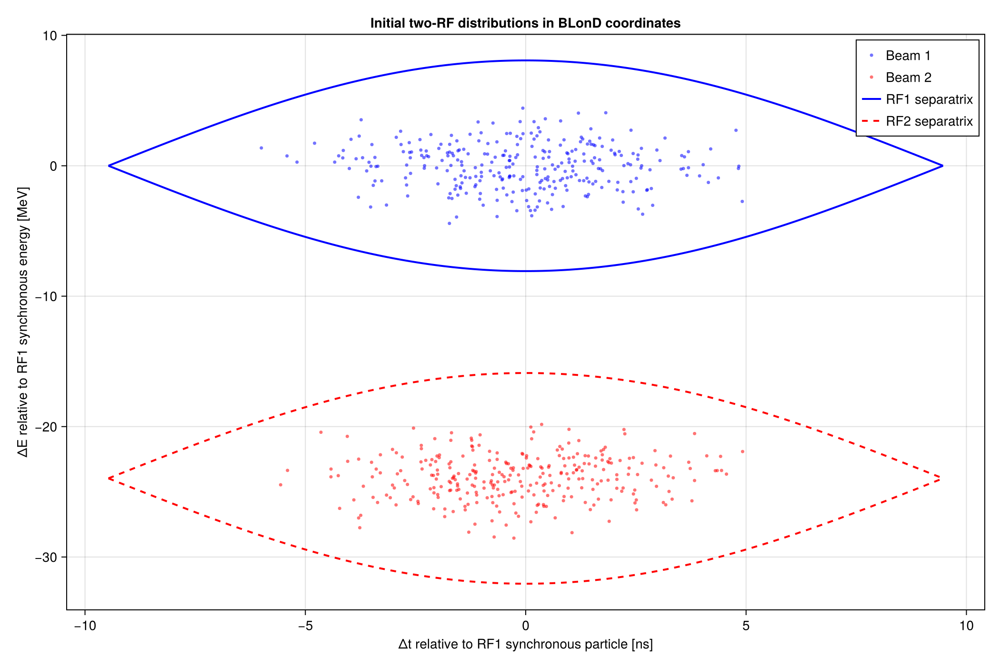

CairoMakie.Screen{IMAGE}


In [10]:
# ------------------------------------------------------------
# Initial particles in physical coordinates
# ------------------------------------------------------------

delta_t1_initial_ns = trajectory.family1.delta_t[1, :] .* 1e9
delta_E1_initial_MeV = trajectory.family1.delta_E[1, :] .* 1e-6

delta_t2_initial_ns =
    trajectory.family2.delta_t_rf1_unwrapped[1, :] .* 1e9

delta_E2_initial_MeV =
    trajectory.family2.delta_E_rf1[1, :] .* 1e-6


# ------------------------------------------------------------
# RF1 separatrix
# ------------------------------------------------------------

theta_separatrix = collect(range(-π, π; length=500))

P_separatrix_upper = 2 .* cos.(theta_separatrix ./ 2)
P_separatrix_lower = -P_separatrix_upper

delta_t1_separatrix_ns =
    delta_t_from_theta(theta_separatrix, two_rf.rf1) .* 1e9

delta_E1_separatrix_upper_MeV =
    delta_energy_from_P(P_separatrix_upper, two_rf.rf1) .* 1e-6

delta_E1_separatrix_lower_MeV =
    delta_energy_from_P(P_separatrix_lower, two_rf.rf1) .* 1e-6


# ------------------------------------------------------------
# RF2 separatrix expressed in RF1 coordinates
# ------------------------------------------------------------

alpha_s_value = slip_stacking_parameter(two_rf)

momentum_scale = synchrotron_tune(two_rf.rf2) /
                 synchrotron_tune(two_rf.rf1)

# At the reference turn N0, the RF2 center phase is relative_phase0
theta2_separatrix_rf1 = wrap_to_pi(
    theta_separatrix .+ two_rf.relative_phase0
)

P2_separatrix_upper_rf1 =
    alpha_s_value .+ momentum_scale .* P_separatrix_upper

P2_separatrix_lower_rf1 =
    alpha_s_value .+ momentum_scale .* P_separatrix_lower

delta_t2_separatrix_ns =
    delta_t_from_theta(theta2_separatrix_rf1, two_rf.rf1) .* 1e9

delta_E2_separatrix_upper_MeV =
    delta_energy_from_P(
        P2_separatrix_upper_rf1,
        two_rf.rf1,
    ) .* 1e-6

delta_E2_separatrix_lower_MeV =
    delta_energy_from_P(
        P2_separatrix_lower_rf1,
        two_rf.rf1,
    ) .* 1e-6

# Wrapping changes the ordering of the horizontal coordinate
rf2_order = sortperm(delta_t2_separatrix_ns)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

initial_physical_figure = Figure(size=(1050, 700))

axis_initial_physical = Axis(
    initial_physical_figure[1, 1];
    xlabel="Δt relative to RF1 synchronous particle [ns]",
    ylabel="ΔE relative to RF1 synchronous energy [MeV]",
    title="Initial two-RF distributions in BLonD coordinates",
    xgridvisible=true,
    ygridvisible=true,
)

scatter!(
    axis_initial_physical,
    delta_t1_initial_ns,
    delta_E1_initial_MeV;
    color=(:blue, 0.55),
    markersize=5,
    label="Beam 1",
)

scatter!(
    axis_initial_physical,
    delta_t2_initial_ns,
    delta_E2_initial_MeV;
    color=(:red, 0.55),
    markersize=5,
    label="Beam 2",
)

# RF1 separatrix
lines!(
    axis_initial_physical,
    delta_t1_separatrix_ns,
    delta_E1_separatrix_upper_MeV;
    color=:blue,
    linewidth=2,
    label="RF1 separatrix",
)

lines!(
    axis_initial_physical,
    delta_t1_separatrix_ns,
    delta_E1_separatrix_lower_MeV;
    color=:blue,
    linewidth=2,
)

# RF2 separatrix
lines!(
    axis_initial_physical,
    delta_t2_separatrix_ns[rf2_order],
    delta_E2_separatrix_upper_MeV[rf2_order];
    color=:red,
    linewidth=2,
    linestyle=:dash,
    label="RF2 separatrix",
)

lines!(
    axis_initial_physical,
    delta_t2_separatrix_ns[rf2_order],
    delta_E2_separatrix_lower_MeV[rf2_order];
    color=:red,
    linewidth=2,
    linestyle=:dash,
)

axislegend(axis_initial_physical; position=:rt)

display(initial_physical_figure)

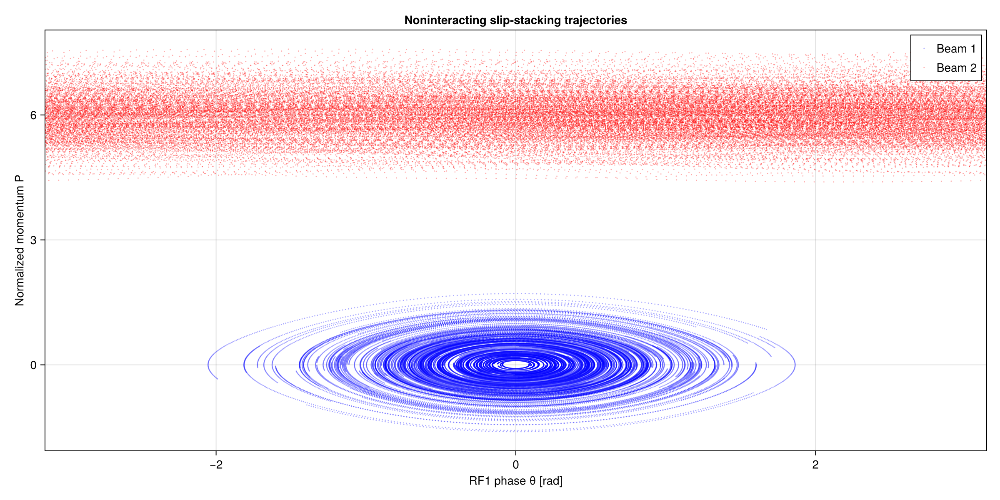

CairoMakie.Screen{IMAGE}


In [11]:
trajectories_figure = Figure(size=(1200, 600))

axis = Axis(
    trajectories_figure[1, 1];
    xlabel="RF1 phase θ [rad]",
    ylabel="Normalized momentum P",
    title="Noninteracting slip-stacking trajectories",
    xgridvisible=true,
    ygridvisible=true,
    limits=((-π, π), nothing),
)

for particle_index in 1:n_particles
    scatter!(
        axis,
        trajectory.family1.theta[:, particle_index],
        trajectory.family1.P[:, particle_index];
        color=(:blue, 0.35),
        markersize=2,
        label=particle_index == 1 ? "Beam 1" : nothing,
    )
end

for particle_index in 1:n_particles
    scatter!(
        axis,
        trajectory.family2.theta_rf1_wrapped[:, particle_index],
        trajectory.family2.P_rf1[:, particle_index];
        color=(:red, 0.35),
        markersize=2,
        label=particle_index == 1 ? "Beam 2" : nothing,
    )
end

axislegend(axis; position=:rt)

display(trajectories_figure)

In [12]:
rf1_machine = two_rf.rf1

delta1 = trajectory.family1.delta_E ./
    (rf1_machine.beta_s^2 * rf1_machine.E_s_eV)

delta2 = trajectory.family2.delta_E_rf1 ./
    (rf1_machine.beta_s^2 * rf1_machine.E_s_eV)

251×300 Matrix{Float64}:
 -0.00272739  -0.00245409  -0.00270666  …  -0.00268627  -0.00253948
 -0.00272344  -0.00245891  -0.00270058     -0.00268505  -0.00253758
 -0.0027195   -0.00246377  -0.0026945      -0.00268383  -0.00253572
 -0.00271555  -0.00246867  -0.00268842     -0.00268261  -0.0025339
 -0.0027116   -0.0024736   -0.00268234     -0.00268141  -0.00253212
 -0.00270765  -0.00247857  -0.00267627  …  -0.00268021  -0.00253038
 -0.0027037   -0.00248358  -0.0026702      -0.00267901  -0.00252867
 -0.00269975  -0.00248862  -0.00266414     -0.00267783  -0.002527
 -0.00269581  -0.00249369  -0.00265808     -0.00267665  -0.00252538
 -0.00269187  -0.00249879  -0.00265202     -0.00267548  -0.00252379
  ⋮                                     ⋱               
 -0.0027947   -0.00288391  -0.0027952      -0.00277027  -0.00292122
 -0.00279848  -0.00287857  -0.00280122     -0.00277121  -0.00292196
 -0.00280224  -0.0028732   -0.00280723     -0.00277214  -0.00292265
 -0.00280599  -0.00286782  -0.0028132

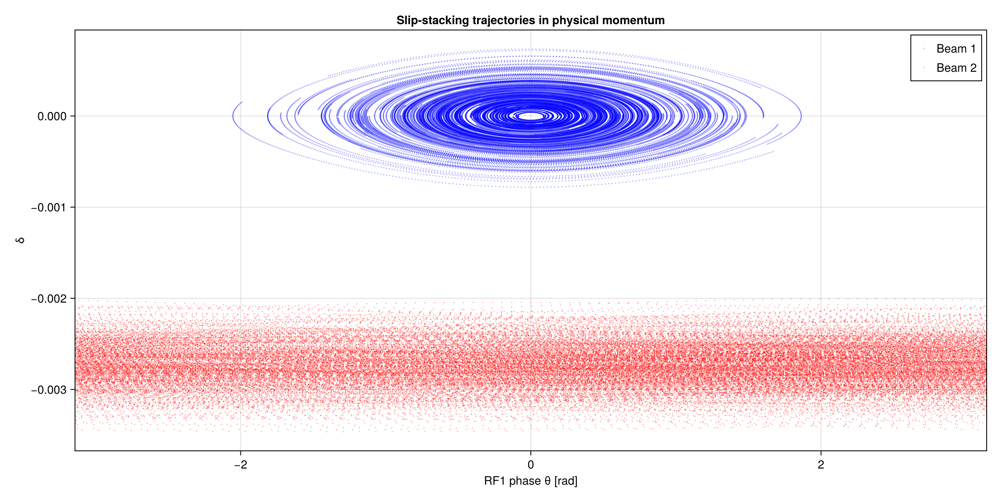

CairoMakie.Screen{IMAGE}


In [13]:
trajectories_figure = Figure(size=(1200, 600))

axis = Axis(
    trajectories_figure[1, 1];
    xlabel="RF1 phase θ [rad]",
    ylabel="δ",
    title="Slip-stacking trajectories in physical momentum",
    xgridvisible=true,
    ygridvisible=true,
    limits=((-π, π), nothing),
)

for particle_index in 1:n_particles
    scatter!(
        axis,
        trajectory.family1.theta[:, particle_index],
        delta1[:, particle_index];
        color=(:blue, 0.35),
        markersize=2,
        label=particle_index == 1 ? "Beam 1" : nothing,
    )
end

for particle_index in 1:n_particles
    scatter!(
        axis,
        trajectory.family2.theta_rf1_wrapped[:, particle_index],
        delta2[:, particle_index];
        color=(:red, 0.35),
        markersize=2,
        label=particle_index == 1 ? "Beam 2" : nothing,
    )
end

axislegend(axis; position=:rt)

display(trajectories_figure)

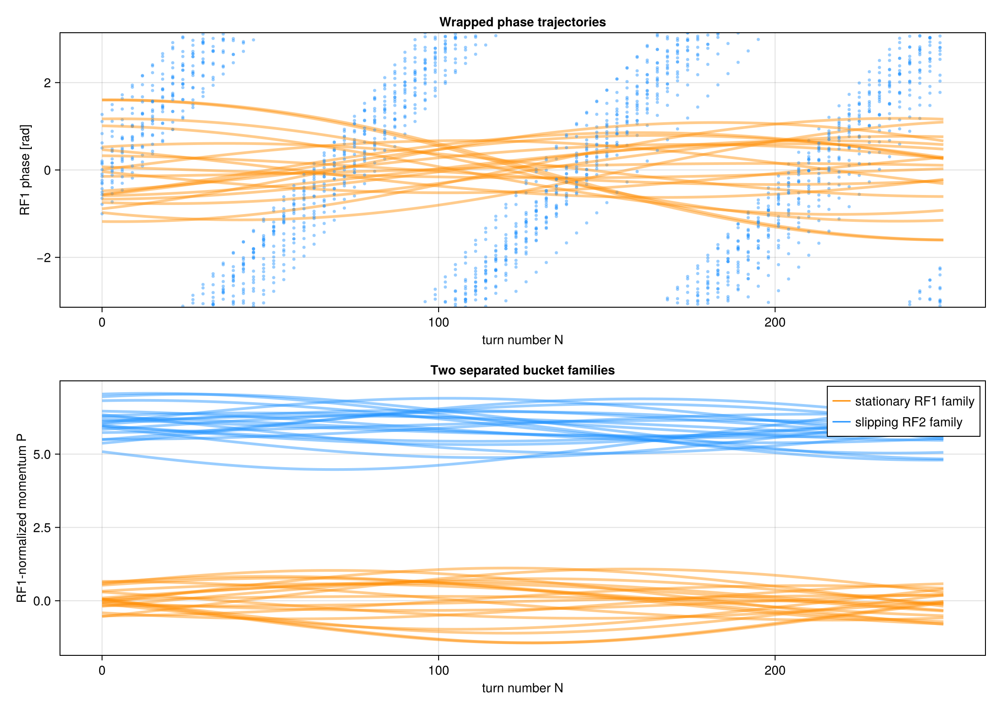

CairoMakie.Screen{IMAGE}


In [14]:
selected_particles = 1:20

trajectory_figure = Figure(size=(1100, 780))

phase_axis = Axis(
    trajectory_figure[1, 1];
    xlabel="turn number N",
    ylabel="RF1 phase [rad]",
    title="Wrapped phase trajectories",
    limits=(nothing, (-pi, pi)),
)

for particle_index in selected_particles
    lines!(
        phase_axis,
        turns,
        trajectory.family1.theta[:, particle_index];
        color=(:darkorange, 0.45),
        linewidth=3,
    )
    scatter!(
        phase_axis,
        turns[1:3:end],
        trajectory.family2.theta_rf1_wrapped[1:3:end, particle_index];
        color=(:dodgerblue, 0.45),
        markersize=5,
    )
end

momentum_axis = Axis(
    trajectory_figure[2, 1];
    xlabel="turn number N",
    ylabel="RF1-normalized momentum P",
    title="Two separated bucket families",
)

for particle_index in selected_particles
    lines!(
        momentum_axis,
        turns,
        trajectory.family1.P[:, particle_index];
        color=(:darkorange, 0.45),
        linewidth=3,
    )
    lines!(
        momentum_axis,
        turns,
        trajectory.family2.P_rf1[:, particle_index];
        color=(:dodgerblue, 0.45),
        linewidth=3,
    )
end

axislegend(
    momentum_axis,
    [
        LineElement(color=:darkorange),
        LineElement(color=:dodgerblue),
    ],
    ["stationary RF1 family", "slipping RF2 family"],
    position=:rt,
)

display(trajectory_figure)

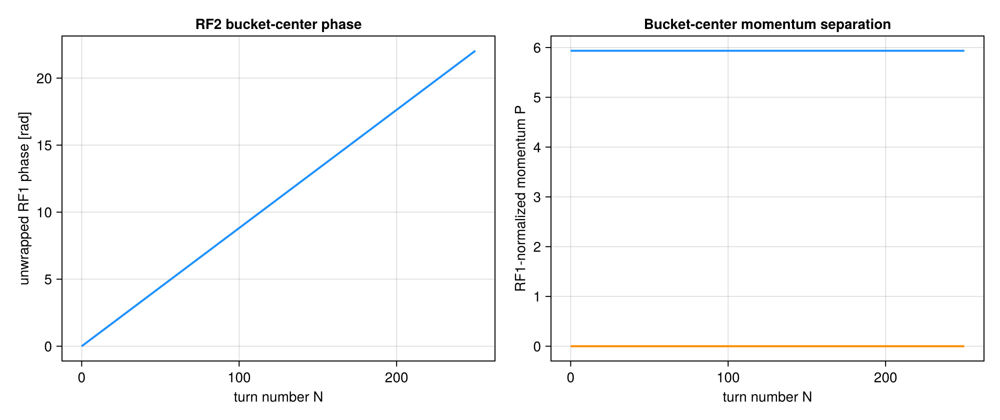

CairoMakie.Screen{IMAGE}


In [15]:
centers = noninteracting_two_rf_transport(
    [0.0],
    [0.0],
    [0.0],
    [0.0],
    turns,
    two_rf,
)

center_figure = Figure(size=(1000, 420))

center_phase_axis = Axis(
    center_figure[1, 1];
    xlabel="turn number N",
    ylabel="unwrapped RF1 phase [rad]",
    title="RF2 bucket-center phase",
)
lines!(
    center_phase_axis,
    turns,
    centers.family2.theta_rf1_unwrapped[:, 1];
    color=:dodgerblue,
    linewidth=2,
)

center_momentum_axis = Axis(
    center_figure[1, 2];
    xlabel="turn number N",
    ylabel="RF1-normalized momentum P",
    title="Bucket-center momentum separation",
)
lines!(
    center_momentum_axis,
    turns,
    centers.family1.P[:, 1];
    color=:darkorange,
    linewidth=2,
)
lines!(
    center_momentum_axis,
    turns,
    centers.family2.P_rf1[:, 1];
    color=:dodgerblue,
    linewidth=2,
)

display(center_figure)

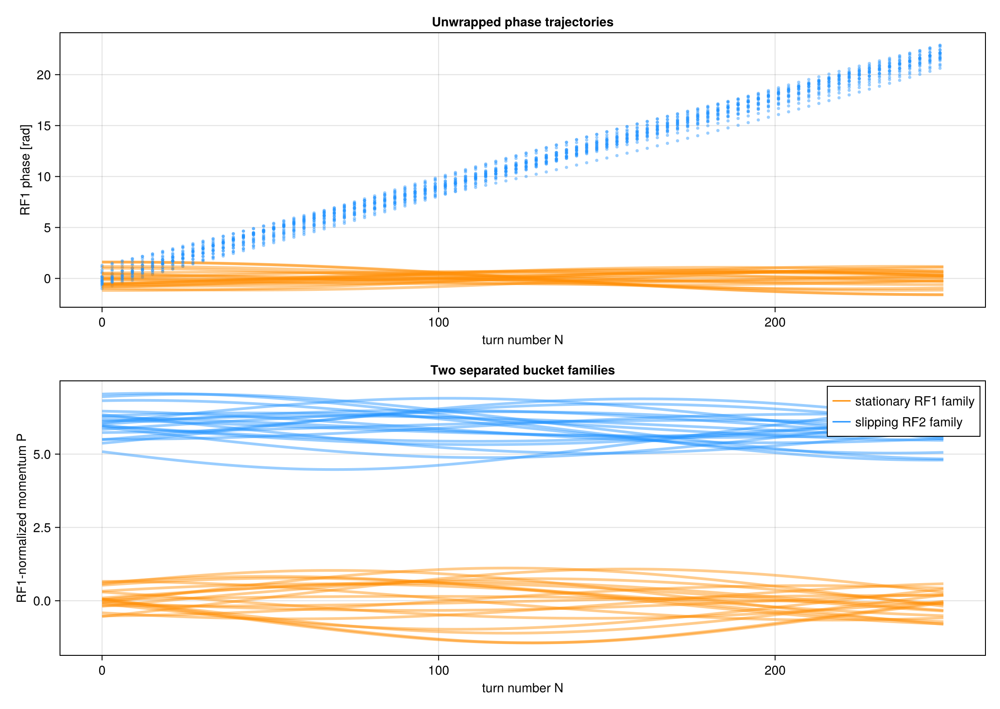

CairoMakie.Screen{IMAGE}


In [16]:
selected_particles = 1:20

trajectory_figure = Figure(size=(1100, 780))

phase_axis = Axis(
    trajectory_figure[1, 1];
    xlabel="turn number N",
    ylabel="RF1 phase [rad]",
    title="Unwrapped phase trajectories",
    limits=(nothing, nothing),
)

for particle_index in selected_particles
    lines!(
        phase_axis,
        turns,
        trajectory.family1.theta[:, particle_index];
        color=(:darkorange, 0.45),
        linewidth=3,
    )
    scatter!(
        phase_axis,
        turns[1:3:end],
        trajectory.family2.theta_rf1_unwrapped[1:3:end, particle_index];
        color=(:dodgerblue, 0.45),
        markersize=5,
    )
end

momentum_axis = Axis(
    trajectory_figure[2, 1];
    xlabel="turn number N",
    ylabel="RF1-normalized momentum P",
    title="Two separated bucket families",
)

for particle_index in selected_particles
    lines!(
        momentum_axis,
        turns,
        trajectory.family1.P[:, particle_index];
        color=(:darkorange, 0.45),
        linewidth=3,
    )
    lines!(
        momentum_axis,
        turns,
        trajectory.family2.P_rf1[:, particle_index];
        color=(:dodgerblue, 0.45),
        linewidth=3,
    )
end

axislegend(
    momentum_axis,
    [
        LineElement(color=:darkorange),
        LineElement(color=:dodgerblue),
    ],
    ["stationary RF1 family", "slipping RF2 family"],
    position=:rt,
)

display(trajectory_figure)